# Final Project - Coronavirus (COVID-19) Pandemic Study

<p><img src="./coronavirus.png" alt="Project Image Record" width="600px"></p>

#### CORONAVIRUS DISEASE (COVID-19)
Coronavirus disease (COVID-19) is an infectious disease caused by a newly discovered coronavirus. This virus is transmitted by droplets and close contact.
The disease causes respiratory illness (like the flu) with symptoms such as a cough, fever, and in more severe cases, difficulty breathing. You can protect yourself by washing your hands frequently, avoiding touching your face, and avoiding close contact (1 meter or 3 feet) with people who are unwell and wearing a mask. Droplets play a very important role because when you speak, there are always droplets coming out of your mouth. Many people have asymptomatic or presymptomatic infections. If they are wearing face masks, it can prevent droplets that carry the virus from escaping and infecting others.

#### HOW DID THIS NEW CORONAVIRUS SPREAD TO HUMANS?

COVID-19 appeared in Wuhan, a city in China, in December 2019. Although health officials are still tracing the exact source of this new coronavirus, early hypotheses thought it may be linked to a seafood market in Wuhan, China. Some people who visited the market developed viral pneumonia caused by the new coronavirus. A study that came out on Jan. 25, 2020, notes that the individual with the first reported case became ill on Dec. 1, 2019, and had no link to the seafood market. Investigations are ongoing as to how this virus originated and spread.

#### WHAT IS THE INCUBATION PERIOD FOR COVID-19?

It appears that symptoms are showing up in people within 14 days of exposure to the virus.

#### WHAT ARE THE SYMPTOMS OF COVID-19?

* Cough
* Fever
* Shortness of breath

In rare cases, COVID-19 can lead to severe respiratory problems, kidney failure or death.

#### IF YOU FEEL SICK AND ARE CONCERNED YOU MIGHT HAVE COVID-19.
If you have a fever or any kind of respiratory difficulty such as coughing or shortness of breath, call your doctor or a health care provider and explain your symptoms over the phone before going to the doctor’s office, urgent care facility or emergency room.

https://www.hopkinsmedicine.org/health/conditions-and-diseases/coronavirus

#### HOW IT SPREADS
Coronavirus disease spreads primarily through contact with an infected person when they cough or sneeze. It also spreads when a person touches a surface or object that has the virus on it, then touches their eyes, nose, or mouth.
This virus is transmitted by droplets and close contact. Droplets play a very important role because when you speak, there are always droplets coming out of your mouth. Many people have asymptomatic or presymptomatic infections. If they are wearing face masks, it can prevent droplets that carry the virus from escaping and infecting others.



#### * There’s currently no vaccine to prevent coronavirus disease (COVID-19).

#### * You can protect yourself and help prevent spreading the virus to others if you:

DO:
Wash your hands regularly for 20 seconds, with soap and water or alcohol-based hand rub

Cover your nose and mouth with a disposable tissue or flexed elbow when you cough or sneeze

Avoid close contact (1 meter or 3 feet) with people who are unwell

Stay home and self-isolate from others in the household if you feel unwell

Wear face masks, it can prevent droplets that carry the virus from escaping and infecting others.

DON'T:
Touch your eyes, nose, or mouth if your hands are not clean

##### Source:  [John Hopkins University and Medicine](https://coronavirus.jhu.edu/map.html)

### STEP 1: IMPORT ALL NECCESSARY LIBRARIES

In [306]:
# import all neccessary libraries
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from matplotlib.pylab import rcParams
import seaborn as sns 
pd.set_option("display.max_columns",None) 
pd.set_option("display.max_rows",None) 

# ignore all harmless waring to keep the notebook clean
import warnings 
warnings.filterwarnings('ignore')

from IPython.display import Image
sns.set(style="darkgrid", palette="pastel", color_codes=True)
sns.set_context("paper")

import plotly.graph_objects as go
import plotly.express as px
import plotly.io as pio
pio.templates.default = "seaborn"
from plotly.subplots import make_subplots

from pathlib import Path
import os

#import pickle
import os.path
from datetime import datetime, timedelta
import pyarrow

# set ggplot style
sns.set_style('whitegrid')                                   
plt.style.use('ggplot')

# keep the plot inline in notebookb
%matplotlib inline
font = {'weight' : 'bold',
        'size'   : 22}

plt.rc('font', **font)

In [307]:
import statsmodels.api as sm
from statsmodels.tools.eval_measures import rmse
from statsmodels.tsa.stattools import adfuller
from statsmodels.tsa.seasonal import seasonal_decompose
from statsmodels.tsa.statespace.sarimax import SARIMAX
from statsmodels.tsa.arima_model import ARIMA
from statsmodels.graphics.tsaplots import plot_acf,plot_pacf # for determining (p,q) orders
from statsmodels.tsa.seasonal import seasonal_decompose      # for ETS Plots
from pmdarima import auto_arima                              # for determining ARIMA orders

from sklearn.metrics import mean_squared_error
from tqdm import tqdm
import itertools

### STEP 2: LOAD DATA

##### Let's start by importing the data

##### The update-to-date data from Kaggle [COVID-19 Complete Dataset (Updated every 24hrs)](https://www.kaggle.com/imdevskp/corona-virus-report) is used for this project.

### We want to automate downloading daily latest datasets using Kaggle API
#### So, we need to create install Kaggle API and setup Kaggle API token following this guideline: https://www.kaggle.com/docs/api

In [308]:
#!pip install kaggle
##
# ONLY NEEDTO RUN THIS TO DOWNLOAD LATEST DATASET
##

# backup old data folder
!mv 'corona-virus-report' 'corona-virus-report_bk'

# delete old dataset zip file
!rm 'corona-virus-report.zip'

# download latest dataset
!kaggle datasets download -d 'imdevskp/corona-virus-report'

# unzip the dataset zip file
import zipfile
with zipfile.ZipFile('./corona-virus-report.zip', 'r') as z:
    z.extractall('./corona-virus-report/')

!ls 'corona-virus-report/'
print('All Done!')

mv: rename corona-virus-report to corona-virus-report_bk/corona-virus-report: Directory not empty
100%|██████████████████████████████████████| 8.64M/8.64M [00:00<00:00, 13.0MB/s]

covid_19_clean_complete.csv usa_county_wise.csv
All Done!


In [309]:
# load data to dataframe
df = pd.read_csv("./corona-virus-report/covid_19_clean_complete.csv", parse_dates = ['Date'])
df.head()

,Province/State,Country/Region,Lat,Long,Date,Confirmed,Deaths,Recovered
0,NaN,Afghanistan,33.0000,65.0000,2020-01-22,0,0,0
1,NaN,Albania,41.1533,20.1683,2020-01-22,0,0,0
2,NaN,Algeria,28.0339,1.6596,2020-01-22,0,0,0
3,NaN,Andorra,42.5063,1.5218,2020-01-22,0,0,0
4,NaN,Angola,-11.2027,17.8739,2020-01-22,0,0,0


### STEP 3: INITIAL EXPLORATORY DATA ANALYSIS - EDA:

In [310]:
# look at the columns
df.columns

Index(['Province/State', 'Country/Region', 'Lat', 'Long', 'Date', 'Confirmed',
       'Deaths', 'Recovered'],
      dtype='object')

## Details about the columns:

In [311]:
# examine dataframe
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 25152 entries, 0 to 25151
Data columns (total 8 columns):
Province/State    7680 non-null object
Country/Region    25152 non-null object
Lat               25152 non-null float64
Long              25152 non-null float64
Date              25152 non-null datetime64[ns]
Confirmed         25152 non-null int64
Deaths            25152 non-null int64
Recovered         25152 non-null int64
dtypes: datetime64[ns](1), float64(2), int64(3), object(2)
memory usage: 1.5+ MB


##### There are 5 numerical columns ('Lat','Long','Confirmed','Deaths','Recovered') , 2 catagorical columns ('Province/State' & 'Country/Region' ) and 1 datetime column ('Date')

In [312]:
# look at some overall stats
df.describe(include = 'object')

,Province/State,Country/Region
count,7680,25152
unique,80,185
top,Saint Pierre and Miquelon,China
freq,96,3168


##### Going in detail, there are 185 unique countries and 80 unique province/states enlisted in the dataset

In [313]:
df.describe()

,Lat,Long,Confirmed,Deaths,Recovered
count,25152.000000,25152.000000,25152.000000,25152.000000,25152.000000
mean,21.433571,22.597991,2430.562420,147.948752,607.899531
std,24.740912,70.570899,23545.664313,1561.525918,5210.234488
min,-51.796300,-135.000000,-1.000000,-1.000000,0.000000
25%,7.000000,-19.020800,0.000000,0.000000,0.000000
50%,23.659750,20.921188,6.000000,0.000000,0.000000
75%,41.204400,81.000000,184.000000,2.000000,18.000000
max,71.706900,178.065000,965785.000000,54881.000000,117727.000000


In [314]:
# look at the start and end date
a = df.Date.value_counts().sort_index()
print('The first date is:', a.index[0])
print('The last date is:', a.index[-1])

The first date is: 2020-01-22 00:00:00
The last date is: 2020-04-26 00:00:00


##### The dataset starts from 22nd January to 28th March 2020

In [315]:
# check missing data
df.isnull().sum()

Province/State    17472
Country/Region        0
Lat                   0
Long                  0
Date                  0
Confirmed             0
Deaths                0
Recovered             0
dtype: int64

In [316]:
# count the null columns
null_columns = df.columns[df.isnull().any()]
df[null_columns].isnull().sum().head()

Province/State    17472
dtype: int64

In [317]:
# glance look at the null data
pd.set_option('display.max_columns', 99999)
print(df[df.isnull().any(axis=1)][null_columns].head())

  Province/State
0            NaN
1            NaN
2            NaN
3            NaN
4            NaN


In [318]:
# glance look at the null data
pd.set_option('display.max_rows', 99999)
print(df[df.isnull().any(axis=1)][null_columns])

      Province/State
0                NaN
1                NaN
2                NaN
3                NaN
4                NaN
5                NaN
6                NaN
7                NaN
16               NaN
17               NaN
18               NaN
19               NaN
20               NaN
21               NaN
22               NaN
23               NaN
24               NaN
25               NaN
26               NaN
27               NaN
28               NaN
29               NaN
30               NaN
31               NaN
32               NaN
33               NaN
34               NaN
46               NaN
47               NaN
48               NaN
82               NaN
83               NaN
84               NaN
85               NaN
86               NaN
87               NaN
88               NaN
89               NaN
90               NaN
91               NaN
94               NaN
95               NaN
96               NaN
97               NaN
98               NaN
99               NaN
100          

In [319]:
len(df['Province/State'].unique())

81

##### Rename columns for more readable and add one more feature

In [320]:
#Renaming the coulmns for easy usage
df.rename(columns={'Date': 'date', 
                     'Province/State':'state',
                     'Country/Region':'country',
                     'Lat':'lat', 'Long':'long',
                     'Confirmed': 'confirmed',
                     'Deaths':'deaths',
                     'Recovered':'recovered'
                    }, inplace=True)

# Active Case = confirmed - deaths - recovered
df['active'] = df['confirmed'] - df['deaths'] - df['recovered']

In [321]:
df.head()

,state,country,lat,long,date,confirmed,deaths,recovered,active
0,NaN,Afghanistan,33.0000,65.0000,2020-01-22,0,0,0,0
1,NaN,Albania,41.1533,20.1683,2020-01-22,0,0,0,0
2,NaN,Algeria,28.0339,1.6596,2020-01-22,0,0,0,0
3,NaN,Andorra,42.5063,1.5218,2020-01-22,0,0,0,0
4,NaN,Angola,-11.2027,17.8739,2020-01-22,0,0,0,0


### STEP 4: VISUALIZATION:

## Active cases around the world:

In [322]:
# get latest date data
top = df[df['date'] == df['date'].max()]

# sum total by each country
world = top.groupby('country')['confirmed','active','deaths', 'recovered'].sum().reset_index()
world

,country,confirmed,active,deaths,recovered
0,Afghanistan,1531,1274,50,207
1,Albania,726,288,28,410
2,Algeria,3382,1449,425,1508
3,Andorra,738,354,40,344
4,Angola,26,18,2,6
5,Antigua and Barbuda,24,10,3,11
6,Argentina,3892,2593,192,1107
7,Armenia,1746,885,28,833
8,Australia,6714,1090,83,5541
9,Austria,15225,2401,542,12282


### Making choropleth maps requires two main types of input:
##### <li>Geometry information:
* some identifying value in properties: Country names.
* one of the built-in geometries within plotly: US states and world countries

##### <li>A list of values indexed by feature identifier: 
* The data is passed into the color argument of <code>px.choropleth</code> in the same order as the IDs are passed into the location argument.

In [323]:
# Try to print out the name of colorscale
import inspect

colorscale_names = []
colors_modules = ['carto', 'colorbrewer', 'cmocean', 'cyclical',
                    'diverging', 'plotlyjs', 'qualitative', 'sequential']
for color_module in colors_modules:
    colorscale_names.extend([name for name, body
                            in inspect.getmembers(getattr(px.colors, color_module))
                            if isinstance(body, list)])

In [324]:
from textwrap import fill

print(fill(''.join(sorted({f'{x: <{15}}' for x in colorscale_names})), 75))

Accent         Aggrnyl        Agsunset       Alphabet       Antique
Armyrose       Blackbody      Bluered        Blues          Blugrn
Bluyl          Bold           BrBG           Brwnyl         BuGn
BuPu           Burg           Burgyl         Cividis        D3
Dark2          Dark24         Darkmint       Earth          Edge
Electric       Emrld          Fall           G10            Geyser
GnBu           Greens         Greys          HSV            Hot
IceFire        Inferno        Jet            Light24        Magenta
Magma          Mint           OrRd           Oranges        Oryel
PRGn           Paired         Pastel         Pastel1        Pastel2
Peach          Phase          PiYG           Picnic         Pinkyl
Plasma         Plotly         Plotly3        Portland       Prism
PuBu           PuBuGn         PuOr           PuRd           Purp
Purples        Purpor         Rainbow        RdBu           RdGy
RdPu           RdYlBu         RdYlGn         Redor          Reds
Safe       

In [325]:
# visualize suing Plotly
figure = px.choropleth(world, locations="country", 
                    locationmode='country names', color="active", 
                    hover_name="country", range_color=[1,1000], 
                    color_continuous_scale="Peach", 
                    title='MAP OF ACTIVE CASES BY COUNTRY')
figure.show()

### MY OBSERVATIONS:
##### 1) Most of the countries have crossed the 10000 barriers, while some of them can control the spread of the virus and have kept it under 1000.
##### 2) China is one of the only nations which has been decreasing the active number of cases
##### 3) But in some other nations like the US, Italy, Spain, France, the number of active cases is rising rapidly.

## Death count around the world:

In [326]:
# visualize death toll using scatter on geographic map
world['size'] = world['deaths'].pow(0.2)
fig = px.scatter_geo(world, locations="country",locationmode='country names', color="deaths",
                     hover_name="country", size="size",
                     #color_continuous_scale = px.colors.sequential.Cividis,
                     projection="natural earth",title='MAP OF DEATH CASES BY COUNTRY')
fig.show()

In [327]:
# visualize suing Plotly
figure = px.choropleth(world, locations="country", 
                    locationmode='country names', color="deaths", 
                    hover_name="country", range_color=[1,1000],
                    #color_continuous_scale=px.colors.diverging.RdYlGn[::-1]
                    color_continuous_scale = px.colors.sequential.thermal[::-1],
                    title='MAP OF DEATH CASES BY COUNTRY')
figure.show()

## Recovered cases count around the world:

In [328]:
# visualize suing Plotly
figure = px.choropleth(world, locations="country", 
                    locationmode='country names', color="recovered", 
                    hover_name="country", range_color=[1,1000],
                    #color_continuous_scale=px.colors.diverging.RdYlGn[::-1]
                    color_continuous_scale = px.colors.sequential.YlGn,
                    title='MAP OF RECOVERED CASES BY COUNTRY')
figure.show()

## Confirmed Cases Over Time

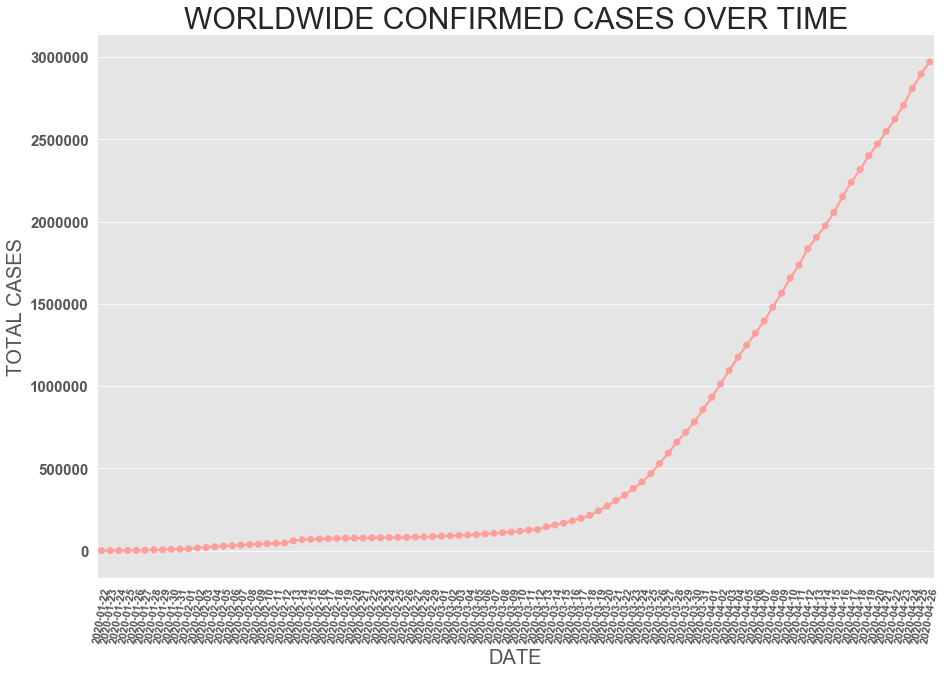

In [329]:
plt.figure(figsize= (15,10))
plt.xticks(rotation = 80 ,fontsize = 11)
plt.yticks(fontsize = 15)
plt.xlabel("DATE",fontsize = 20)
plt.ylabel('TOTAL CASES',fontsize = 20)
plt.title("WORLDWIDE CONFIRMED CASES OVER TIME" , fontsize = 30)
total_cases = df.groupby('date')['date', 'confirmed'].sum().reset_index()
total_cases['date'] = pd.to_datetime(total_cases['date'])


ax = sns.pointplot( x = total_cases.date.dt.date ,y = total_cases.confirmed , color = 'r')
ax.set(xlabel='DATE', ylabel='TOTAL CASES');

In [330]:
total_cases

,date,confirmed
0,2020-01-22,555
1,2020-01-23,654
2,2020-01-24,941
3,2020-01-25,1434
4,2020-01-26,2118
5,2020-01-27,2927
6,2020-01-28,5578
7,2020-01-29,6166
8,2020-01-30,8234
9,2020-01-31,9927


### MY OBSERVATIONS:
##### 1) The slope of the line, in the beginning, was gradually ascending and at recent times, it's very high!
##### 2) At the current rate, there are no signs of a drop in the total cases.
##### 3) If protective measures are not taken, there's no wonder the slope reaches to max

## TOP 20 COUNTRIES HAVING MOST CONFIRMED CASES

In [331]:
# group by country to sum and sort to get the top country list
top = df[df['date'] == df['date'].max()]
top_casualities = top.groupby(by = 'country')['confirmed'].sum().sort_values(ascending = False).head(20).reset_index()
top_casualities

,country,confirmed
0,US,965785
1,Spain,226629
2,Italy,197675
3,France,162220
4,Germany,157770
5,United Kingdom,154037
6,Turkey,110130
7,Iran,90481
8,China,83912
9,Russia,80949


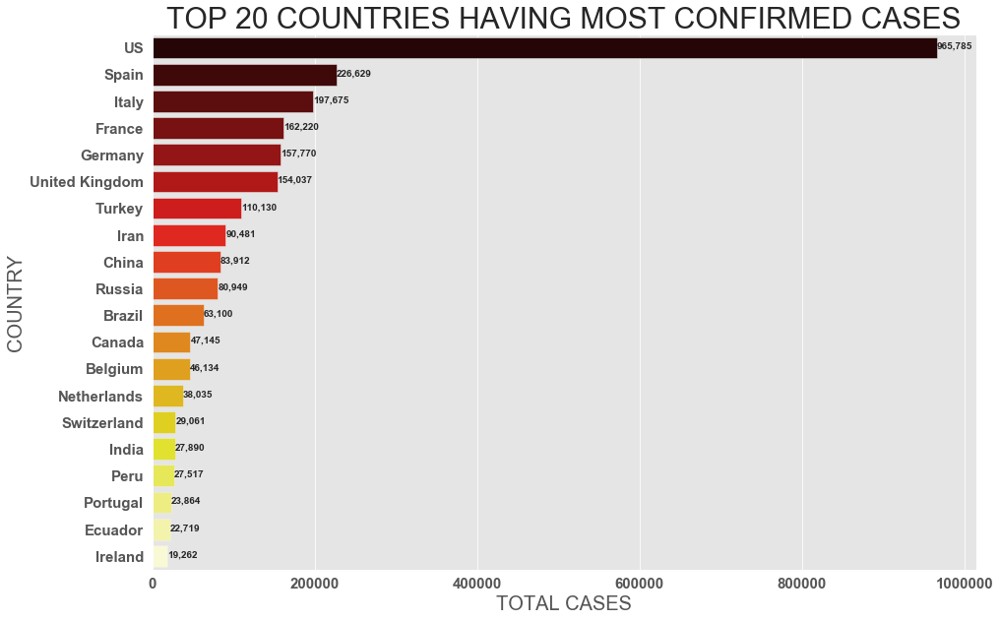

In [332]:
# visualize it
plt.figure(figsize= (15,10))
plt.xticks(fontsize = 15)
plt.yticks(fontsize = 15)
plt.xlabel("TOTAL CASES",fontsize = 20)
plt.ylabel('COUNTRY',fontsize = 20)
plt.title("TOP 20 COUNTRIES HAVING MOST CONFIRMED CASES" , fontsize = 30)
ax = sns.barplot(x = top_casualities.confirmed, y = top_casualities.country, palette = 'hot')
for i, (value, name) in enumerate(zip(top_casualities.confirmed,top_casualities.country)):
    ax.text(value, i-.05, f'{value:,.0f}',  size=10, ha='left',  va='center')
ax.set(xlabel='TOTAL CASES', ylabel='COUNTRY');

### MY OBSERVATIONS:
##### 1) China was leading this from many days, but now they can control the pandemic spread.
##### 2) The number of confirmed cases are on a high in the US, Italy, Spain, and France.
##### 3) But the number of cases in the third world countries is quite less.

## C. Top 20 countries having most active cases

In [333]:
top_actives = top.groupby(by = 'country')['active'].sum().sort_values(ascending = False).head(20).reset_index()
top_actives

,country,active
0,US,803916
1,United Kingdom,132465
2,Italy,106103
3,France,93649
4,Spain,85712
5,Turkey,78185
6,Russia,73435
7,Canada,44484
8,Germany,39794
9,Netherlands,33427


In [334]:
top_actives_list = top_actives['country']
top_actives_list

0                 US
1     United Kingdom
2              Italy
3             France
4              Spain
5             Turkey
6             Russia
7             Canada
8            Germany
9        Netherlands
10            Brazil
11           Belgium
12          Portugal
13           Ecuador
14             India
15              Peru
16            Sweden
17              Iran
18      Saudi Arabia
19         Singapore
Name: country, dtype: object

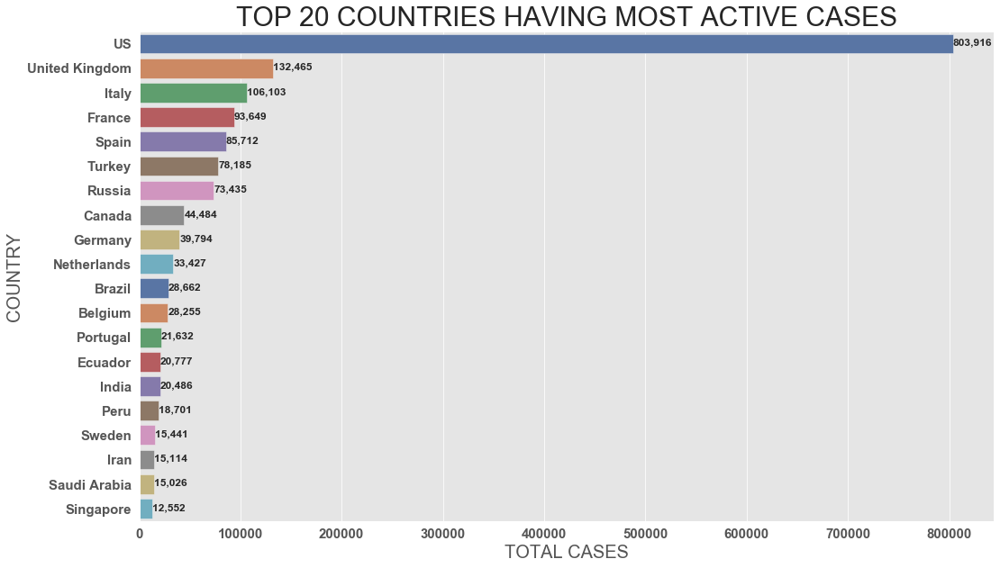

In [335]:
plt.figure(figsize= (17,10))
plt.xticks(fontsize = 15)
plt.yticks(fontsize = 15)
plt.xlabel("TOTAL CASES",fontsize = 20)
plt.ylabel('COUNTRY',fontsize = 20)
plt.title("TOP 20 COUNTRIES HAVING MOST ACTIVE CASES" , fontsize = 30)
ax = sns.barplot(x = top_actives.active, y = top_actives.country, palette="deep")
for i, (value, name) in enumerate(zip(top_actives.active, top_actives.country)):
    ax.text(value, i-.05, f'{value:,.0f}',  size=12, ha='left',  va='center')
ax.set(xlabel='TOTAL CASES', ylabel='COUNTRY');

### MY OBSERVATIONS:
##### 1) As the covid-19 testing is increasing, The active number of cases is also increasing day by day.
##### 2) The number of active cases is on a high in the US, Italy, Spain, and France.
##### 3) In comparison with the total population, Italy, Spain and France are the worst-hit nation. 

## D. Top 20 countries having most deaths

In [336]:
top_deaths = top.groupby(by = 'country')['deaths'].sum().sort_values(ascending = False).head(20).reset_index()
top_deaths

,country,deaths
0,US,54881
1,Italy,26644
2,Spain,23190
3,France,22890
4,United Kingdom,20794
5,Belgium,7094
6,Germany,5976
7,Iran,5710
8,China,4637
9,Netherlands,4491


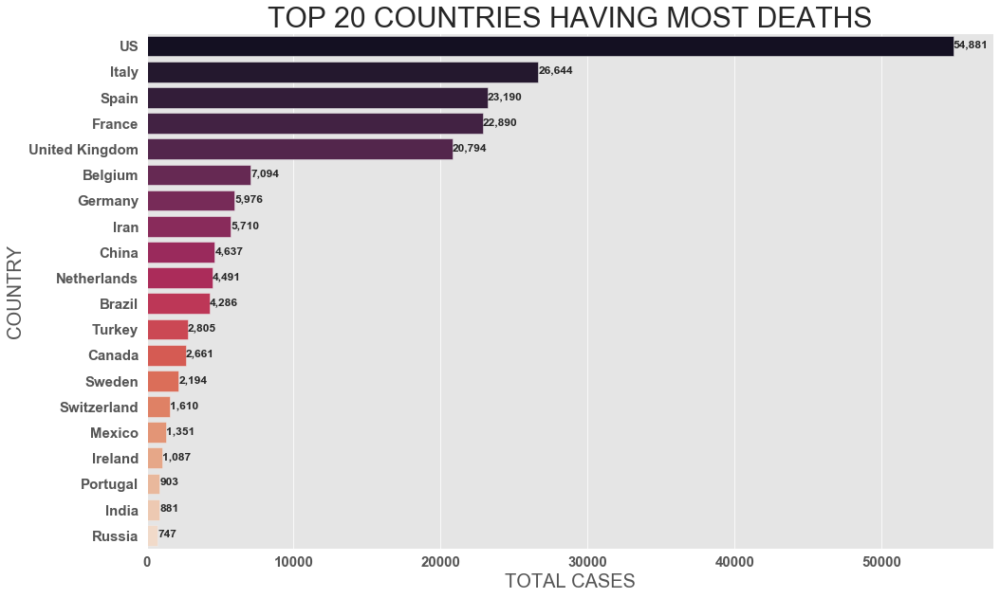

In [337]:
plt.figure(figsize= (16,10))
plt.xticks(fontsize = 15)
plt.yticks(fontsize = 15)
plt.xlabel("TOTAL CASES",fontsize = 20)
plt.ylabel('COUNTRY',fontsize = 20)
plt.title("TOP 20 COUNTRIES HAVING MOST DEATHS" , fontsize = 30)
ax = sns.barplot(x = top_deaths.deaths, y = top_deaths.country, palette = "rocket")
for i, (value, name) in enumerate(zip(top_deaths.deaths,top_deaths.country)):
    ax.text(value, i-.05, f'{value:,.0f}',  size=12, ha='left',  va='center')
ax.set(xlabel='TOTAL CASES', ylabel='COUNTRY');

### MY OBSERVATIONS:
##### 1) Even though Italy has the 2nd best healthcare system according to the WHO, they haven't been able to tackle the pandemic problem effectively.
##### 2) China even having so many confirmed cases was able to decrease the number of deaths
##### 3) The number of deaths is also on a rise, especially in Italy, Spain, and Iran.

## E. Top 20 countries having most recovered cases

In [338]:
top_recovered = top.groupby(by = 'country')['recovered'].sum().sort_values(ascending = False).head(20).reset_index()
top_recovered

,country,recovered
0,Spain,117727
1,Germany,112000
2,US,106988
3,China,75718
4,Iran,69657
5,Italy,64928
6,France,45681
7,Brazil,30152
8,Turkey,29140
9,Switzerland,21800


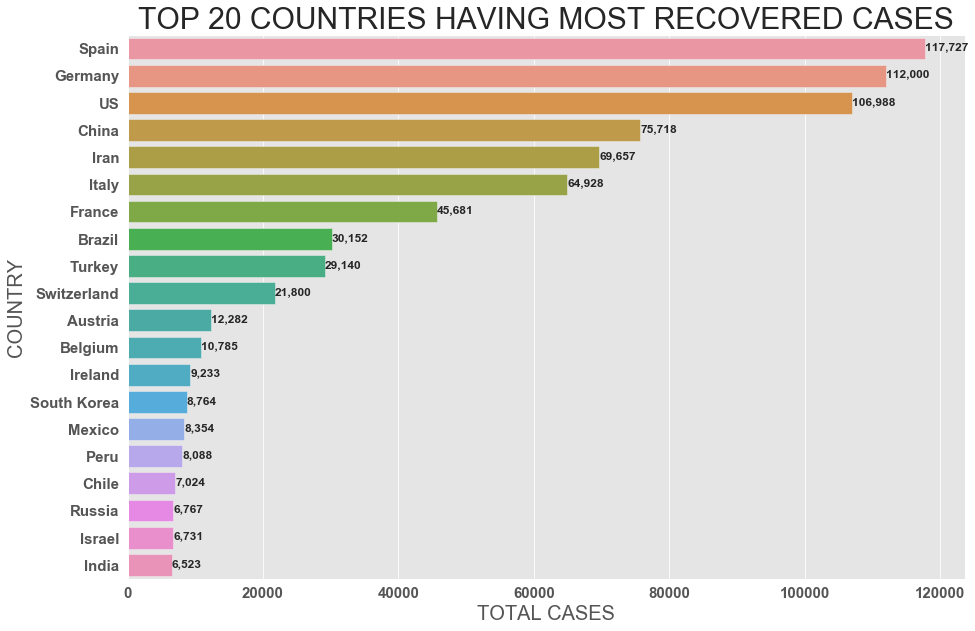

In [339]:
plt.figure(figsize= (15,10))
plt.xticks(fontsize = 15)
plt.yticks(fontsize = 15)
plt.xlabel("TOTAL CASES",fontsize = 20)
plt.ylabel('COUNTRY',fontsize = 20)
plt.title("TOP 20 COUNTRIES HAVING MOST RECOVERED CASES" , fontsize = 30)
ax = sns.barplot(x = top_recovered.recovered, y = top_recovered.country)
for i, (value, name) in enumerate(zip(top_recovered.recovered,top_recovered.country)):
    ax.text(value, i-.05, f'{value:,.0f}',  size=12, ha='left',  va='center')
ax.set(xlabel='TOTAL CASES', ylabel='COUNTRY');

### MY OBSERVATIONS:
##### 1) By far China is leading in the number of recoveries even though having a huge number of confirmed cases
##### 2) Italy, Iran, and Spain are also doing a good job.
##### 3) We have to pump up these numbers for a promising future!

## F. Top 20 countries having the worst mortality and best recovery rate:

In [340]:
rate = top.groupby(by = 'country')['recovered','confirmed','deaths'].sum().reset_index()
rate['recovery percentage'] =  round(((rate['recovered']) / (rate['confirmed'])) * 100 , 2)
rate['death percentage'] =  round(((rate['deaths']) / (rate['confirmed'])) * 100 , 2)
rate

,country,recovered,confirmed,deaths,recovery percentage,death percentage
0,Afghanistan,207,1531,50,13.52,3.27
1,Albania,410,726,28,56.47,3.86
2,Algeria,1508,3382,425,44.59,12.57
3,Andorra,344,738,40,46.61,5.42
4,Angola,6,26,2,23.08,7.69
5,Antigua and Barbuda,11,24,3,45.83,12.50
6,Argentina,1107,3892,192,28.44,4.93
7,Armenia,833,1746,28,47.71,1.60
8,Australia,5541,6714,83,82.53,1.24
9,Austria,12282,15225,542,80.67,3.56


In [341]:
mortality = rate.groupby(by = 'country')['death percentage'].sum().sort_values(ascending = False).head(23).reset_index()
mortality

,country,death percentage
0,Nicaragua,23.08
1,MS Zaandam,22.22
2,Belgium,15.38
3,Mauritania,14.29
4,France,14.11
5,Bahamas,13.75
6,United Kingdom,13.50
7,Italy,13.48
8,Zimbabwe,12.90
9,Algeria,12.57


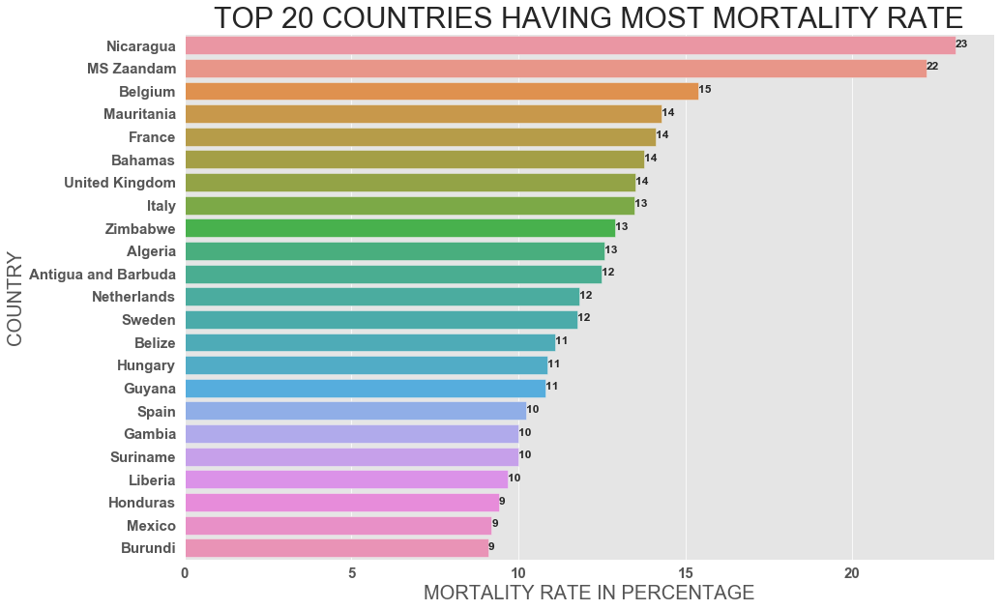

In [342]:
plt.figure(figsize= (15,10))
plt.xticks(fontsize = 15)
plt.yticks(fontsize = 15)
plt.xlabel("Total cases",fontsize = 20)
plt.ylabel('Country',fontsize = 20)
plt.title("TOP 20 COUNTRIES HAVING MOST MORTALITY RATE" , fontsize = 30)
ax = sns.barplot(x = mortality['death percentage'], y = mortality.country)
for i, (value, name) in enumerate(zip(mortality['death percentage'], mortality.country)):
    ax.text(value, i-.05, f'{value:,.0f}',  size=12, ha='left',  va='center')
ax.set(xlabel='MORTALITY RATE IN PERCENTAGE', ylabel='COUNTRY');

### MY OBSERVATIONS:
##### 1) Zimbabwe, Sudan and the Gambia have the highest mortality rate because there is very less number of the confirmed cases, yet there more deaths in them.
##### 2) The majority of the countries which top the list have a bad healthcare system and they require help from developed countries.
##### 3) But when a minimum of 100 confirmed cases is considered, San Marino, Iraq and Indonesia top the charts
##### 4) When more than 10000 confirmed cases are considered, Italy is at the top and this percentage rate is very scary. It seems that they have lost control over the spread of covid-19 and cannot contain it.

In [343]:
recovery = rate.groupby(by = 'country')['recovery percentage'].sum().sort_values(ascending = False).head(20).reset_index()
recovery

,country,recovery percentage
0,Saint Lucia,100.00
1,Cambodia,95.90
2,Diamond Princess,90.59
3,China,90.24
4,Mauritius,90.06
5,Iceland,89.73
6,Brunei,89.13
7,Thailand,88.77
8,Mauritania,85.71
9,Luxembourg,83.37


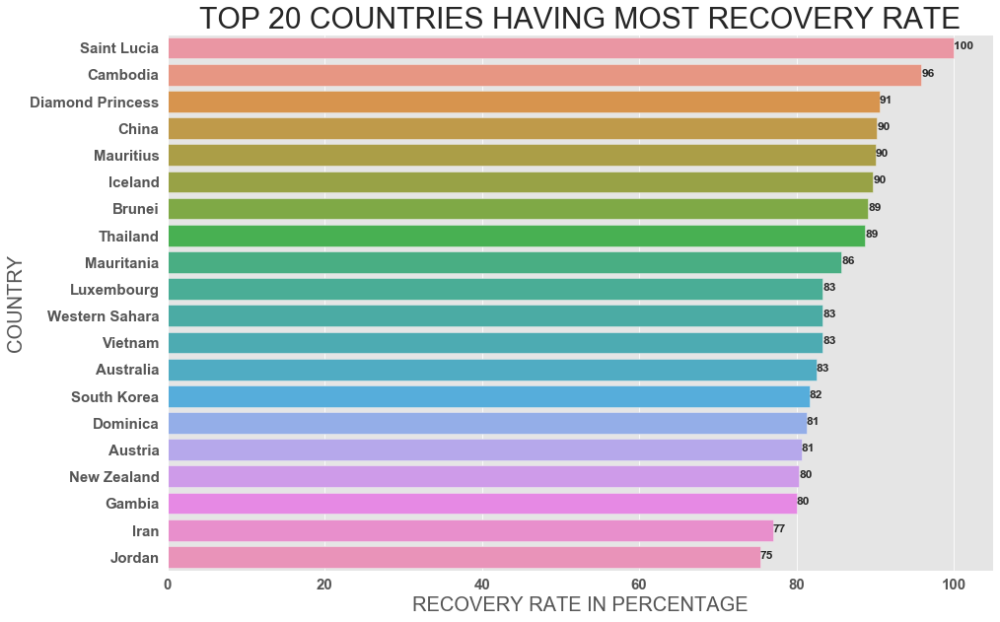

In [344]:
plt.figure(figsize= (15,10))
plt.xticks(fontsize = 15)
plt.yticks(fontsize = 15)
plt.xlabel("TOTAL CASES",fontsize = 20)
plt.ylabel('COUNTRY',fontsize = 20)
plt.title("TOP 20 COUNTRIES HAVING MOST RECOVERY RATE" , fontsize = 30)
ax = sns.barplot(x = recovery['recovery percentage'], y = recovery.country)
for i, (value, name) in enumerate(zip(recovery['recovery percentage'], recovery.country)):
    ax.text(value, i-.05, f'{value:,.0f}',  size=12, ha='left',  va='center')
ax.set(xlabel='RECOVERY RATE IN PERCENTAGE', ylabel='COUNTRY');

### MY OBSERVATIONS:
##### 1) China tops the chart and they are doing a remarkable job with a recovery rate of 90%. It tells us that in every 100 infected people, 90 people have recovered from the covid-19 virus.
##### 2) The Cruise ship is unusual here as the outbreak was a while ago and it explains the high recovery rate.
##### 3) South Korea, Bahrain and Iran are also doing a fantastic job treating the covid-19 virus.
##### 4) Surprisingly the Maldives have recovered 8 out of their 13 confirmed cases.

# 3. Analysis of most affected countries

#### I will select the most affected countries for further analysis and visualization i.e China, US, Italy.
#### I will also select India so that I can analyze and foresee the covid - 19 problem of our country.
#### The analysis and visualizations of the covid cases in each country will start from the day of their first covid-19 case. From this, we can get valuable insights like the rate of growth of the covid-19 virus.

#### The first case of China recorded in this dataset is 22nd January,2020 . So let's consider it as day 1 and make the required changes in the dataset.

In [345]:
china =  df[df.country == 'China']
china = china.groupby(by = 'date')['recovered', 'deaths', 'confirmed', 'active'].sum().reset_index()
china

,date,recovered,deaths,confirmed,active
0,2020-01-22,28,17,548,503
1,2020-01-23,30,18,643,595
2,2020-01-24,35,26,920,859
3,2020-01-25,38,42,1406,1326
4,2020-01-26,48,56,2075,1971
5,2020-01-27,55,82,2877,2740
6,2020-01-28,97,131,5509,5281
7,2020-01-29,114,133,6087,5840
8,2020-01-30,128,171,8141,7842
9,2020-01-31,201,213,9802,9388


#### The first case recorded in US is on 24th February, 2020. So let's consider it as day 1 and make the required changes in the dataset

In [346]:
us =  df[df.country == 'US']
us = us.groupby(by = 'date')['recovered', 'deaths', 'confirmed', 'active'].sum().reset_index()
us = us.iloc[33:].reset_index().drop('index', axis = 1)
us

,date,recovered,deaths,confirmed,active
0,2020-02-24,5,0,51,46
1,2020-02-25,6,0,51,45
2,2020-02-26,6,0,57,51
3,2020-02-27,6,0,58,52
4,2020-02-28,7,0,60,53
5,2020-02-29,7,1,68,60
6,2020-03-01,7,1,74,66
7,2020-03-02,7,6,98,85
8,2020-03-03,7,7,118,104
9,2020-03-04,7,11,149,131


#### The first case recorded in Italy is on 31st January. So let's consider it as day 1 and make the required changes in the dataset.

In [347]:
italy =  df[df.country == 'Italy']
italy = italy.groupby(by = 'date')['recovered', 'deaths', 'confirmed', 'active'].sum().reset_index()
italy = italy.iloc[9:].reset_index().drop('index', axis = 1)
italy

,date,recovered,deaths,confirmed,active
0,2020-01-31,0,0,2,2
1,2020-02-01,0,0,2,2
2,2020-02-02,0,0,2,2
3,2020-02-03,0,0,2,2
4,2020-02-04,0,0,2,2
5,2020-02-05,0,0,2,2
6,2020-02-06,0,0,2,2
7,2020-02-07,0,0,3,3
8,2020-02-08,0,0,3,3
9,2020-02-09,0,0,3,3


#### The first case recorded in India is on 30th January. So let's consider it as day 1 and make the required changes in the dataset.

In [348]:
india =  df[df.country == 'India']
india = india.groupby(by = 'date')['recovered', 'deaths', 'confirmed', 'active'].sum().reset_index()
india = india.iloc[8:].reset_index().drop('index', axis = 1)
india

,date,recovered,deaths,confirmed,active
0,2020-01-30,0,0,1,1
1,2020-01-31,0,0,1,1
2,2020-02-01,0,0,1,1
3,2020-02-02,0,0,2,2
4,2020-02-03,0,0,3,3
5,2020-02-04,0,0,3,3
6,2020-02-05,0,0,3,3
7,2020-02-06,0,0,3,3
8,2020-02-07,0,0,3,3
9,2020-02-08,0,0,3,3


## COMPARISION ON NUMBER OF CONFIRMED CASES TILL DATE:

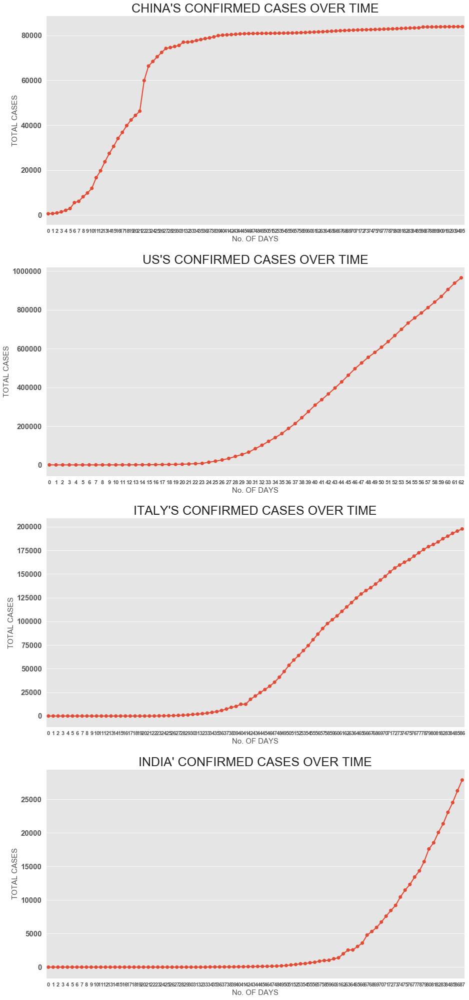

In [349]:
plt.figure(figsize=(15,30))
a = plt.subplot(4, 1, 1)
sns.pointplot(china.index ,china.confirmed)
plt.title("CHINA'S CONFIRMED CASES OVER TIME" , fontsize = 25)
plt.xticks(fontsize = 11)
plt.yticks(fontsize = 15)
plt.xlabel('No. OF DAYS', fontsize = 15)
plt.ylabel('TOTAL CASES', fontsize = 15)

plt.subplot(4, 1, 2)
sns.pointplot(us.index ,us.confirmed)
plt.title("US'S CONFIRMED CASES OVER TIME" , fontsize = 25)
plt.xticks(fontsize = 11)
plt.yticks(fontsize = 15)
plt.xlabel('No. OF DAYS', fontsize = 15)
plt.ylabel('TOTAL CASES', fontsize = 15)

plt.subplot(4, 1, 3)
sns.pointplot(italy.index ,italy.confirmed)
plt.title("ITALY'S CONFIRMED CASES OVER TIME" , fontsize = 25)
plt.xticks(fontsize = 11)
plt.yticks(fontsize = 15)
plt.xlabel('No. OF DAYS', fontsize = 15)
plt.ylabel('TOTAL CASES', fontsize = 15)

plt.subplot(4, 1, 4)
sns.pointplot(india.index ,india.confirmed)
plt.title("INDIA' CONFIRMED CASES OVER TIME" , fontsize = 25)
plt.xticks(fontsize = 11)
plt.yticks(fontsize = 15)
plt.xlabel('No. OF DAYS', fontsize = 15)
plt.ylabel('TOTAL CASES', fontsize = 15)

plt.subplots_adjust(bottom=0.01, top=0.9)

### MY OBSERVATIONS: 
##### 1) From Day 0 to Day 15, China has very a high slope as the covid-19 originated there. Whereas in other countries, the slope is quite low.
##### 2) After day 15, there was an incremental rise in the number of cases in the US, whereas in Italy and India it is still less.
##### 3) But after that, there is a high surge in no. of cases in US and Italy
##### 4) India seems to be doing a great job in controlling the spread of the virus and keep the count of cases less. But lately, there has been a rise in the number of cases!

## COMPARISION ON NUMBER OF ACTIVE CASES NOW:

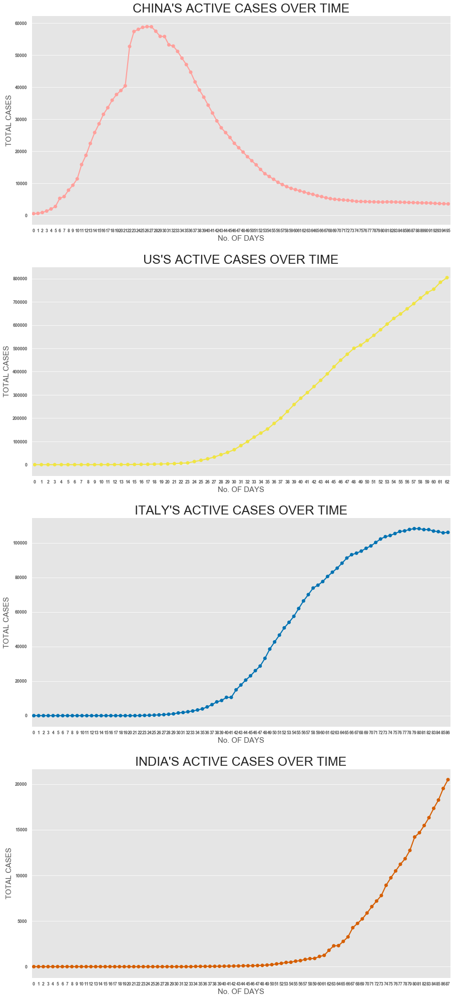

In [350]:
plt.figure(figsize=(15,30))
plt.subplot(4, 1, 1)
sns.pointplot(china.index ,china.active, color = 'r')
plt.title("CHINA'S ACTIVE CASES OVER TIME" , fontsize = 25)
plt.xlabel('No. OF DAYS', fontsize = 15)
plt.ylabel('TOTAL CASES', fontsize = 15)

plt.subplot(4, 1, 2)
sns.pointplot(us.index ,us.active, color = '#F0E442')
plt.title("US'S ACTIVE CASES OVER TIME" , fontsize = 25)
plt.xlabel('No. OF DAYS', fontsize = 15)
plt.ylabel('TOTAL CASES', fontsize = 15)

plt.subplot(4, 1, 3)
sns.pointplot(italy.index ,italy.active, color = '#0072B2')
plt.title("ITALY'S ACTIVE CASES OVER TIME" , fontsize = 25)
plt.xlabel('No. OF DAYS', fontsize = 15)
plt.ylabel('TOTAL CASES', fontsize = 15)

plt.subplot(4, 1, 4)
sns.pointplot(india.index ,india.active, color = '#D55E00')
plt.title("INDIA'S ACTIVE CASES OVER TIME" , fontsize = 25)
plt.xlabel('No. OF DAYS', fontsize = 15)
plt.ylabel('TOTAL CASES', fontsize = 15)

plt.subplots_adjust(bottom=0.01, top=0.9)

### MY OBSERVATIONS:
##### 1) It's showing the same insights as to the confirmed cases
##### 2) But the only difference is the no.of active cases in China has been incrementally decreasing from day 30 as there a few deaths and a lot of recovered people and they have also prevented the spread of the covid-19 virus. 
##### 3) The no. of active cases in the US and Italy is rising detrimentally.
##### 4) Even though the slope of India is high but the rate of increase is less.

## COMPARISION ON NUMBER OF DEATH CASES TILL DATE:

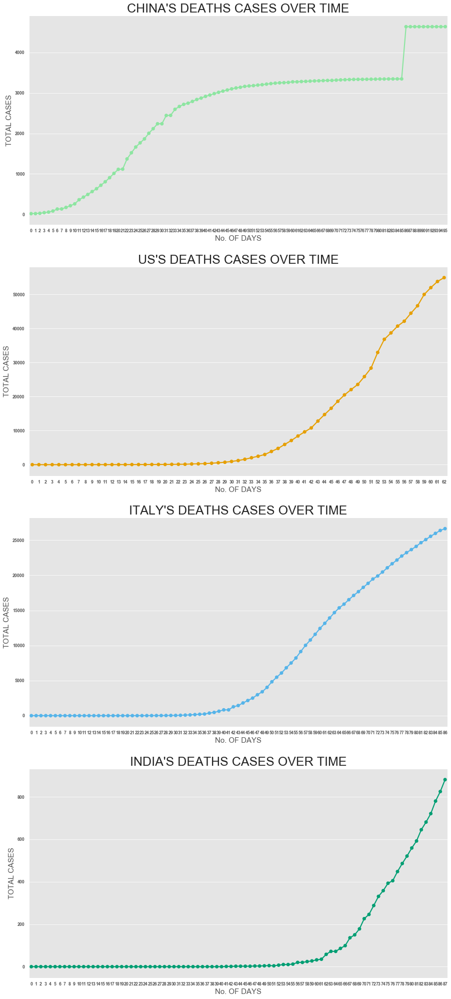

In [351]:
plt.figure(figsize=(15,30))
plt.subplot(4, 1, 1)
sns.pointplot(china.index ,china.deaths, color = 'g')
plt.title("CHINA'S DEATHS CASES OVER TIME" , fontsize = 25)
plt.xlabel('No. OF DAYS', fontsize = 15)
plt.ylabel('TOTAL CASES', fontsize = 15)

plt.subplot(4, 1, 2)
sns.pointplot(us.index ,us.deaths, color = '#E69F00')
plt.title("US'S DEATHS CASES OVER TIME" , fontsize = 25)
plt.xlabel('No. OF DAYS', fontsize = 15)
plt.ylabel('TOTAL CASES', fontsize = 15)

plt.subplot(4, 1, 3)
sns.pointplot(italy.index ,italy.deaths, color = '#56B4E9')
plt.title("ITALY'S DEATHS CASES OVER TIME" , fontsize = 25)
plt.xlabel('No. OF DAYS', fontsize = 15)
plt.ylabel('TOTAL CASES', fontsize = 15)

plt.subplot(4, 1, 4)
sns.pointplot(india.index ,india.deaths, color = '#009E73')
plt.title("INDIA'S DEATHS CASES OVER TIME" , fontsize = 25)
plt.xlabel('No. OF DAYS', fontsize = 15)
plt.ylabel('TOTAL CASES', fontsize = 15)

plt.subplots_adjust(bottom=0.01, top=0.9)

### MY OBSERVATIONS:
##### 1) Even though China was the first to get the virus, they were able to minimize the no. of deaths considerably after Day 30.
##### 2) But lately there has been a huge surge in no. of deaths in Italy and it has also crossed the most no. of deaths in the world.
##### 3) There is also a slight increase in no. of deaths in the US.
##### 4) India on the other hand considerably have very less no. of deaths.

## COMPARISION ON NUMBER OF RECOVERED CASES TILL DATE:

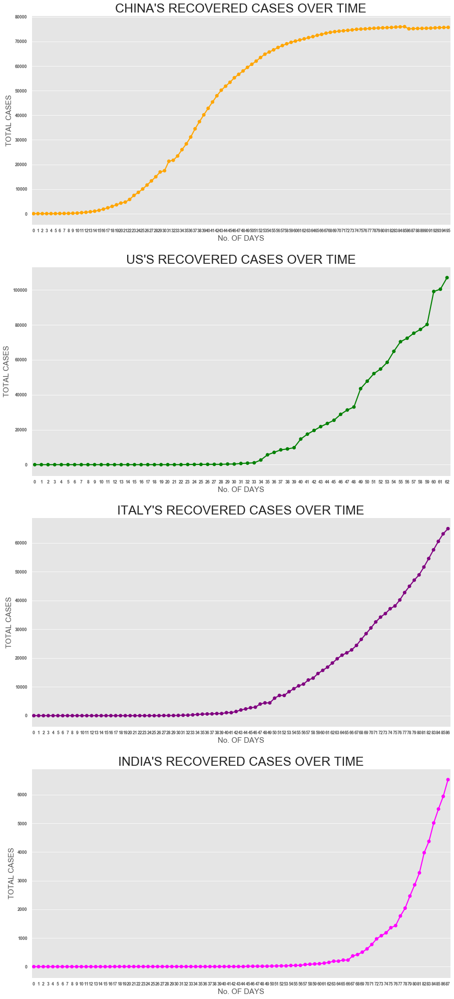

In [352]:
plt.figure(figsize=(15,30))
plt.subplot(4, 1, 1)
sns.pointplot(china.index ,china.recovered, color = 'orange')
plt.title("CHINA'S RECOVERED CASES OVER TIME" , fontsize = 25)
plt.xlabel('No. OF DAYS', fontsize = 15)
plt.ylabel('TOTAL CASES', fontsize = 15)

plt.subplot(4, 1, 2)
sns.pointplot(us.index ,us.recovered, color = 'green')
plt.title("US'S RECOVERED CASES OVER TIME" , fontsize = 25)
plt.xlabel('No. OF DAYS', fontsize = 15)
plt.ylabel('TOTAL CASES', fontsize = 15)

plt.subplot(4, 1, 3)
sns.pointplot(italy.index ,italy.recovered, color = 'purple')
plt.title("ITALY'S RECOVERED CASES OVER TIME" , fontsize = 25)
plt.xlabel('No. OF DAYS', fontsize = 15)
plt.ylabel('TOTAL CASES', fontsize = 15)

plt.subplot(4, 1, 4)
sns.pointplot(india.index ,india.recovered, color = 'magenta')
plt.title("INDIA'S RECOVERED CASES OVER TIME" , fontsize = 25)
plt.xlabel('No. OF DAYS', fontsize = 15)
plt.ylabel('TOTAL CASES', fontsize = 15)

plt.subplots_adjust(bottom=0.01, top=0.9)

##### Here are my observations:
##### 1) Compared to the number of confirmed cases, China has done an incredible job in recovering so many patients from the covid-19 pandemic.
##### 2) Italy is also trying to increase the number of recoveries, but lately the number of deaths has gone through the roof.
##### 3) Recoveries of the US and India are also less. 

## USING DEEP LEARNING TO PREDICT

In [353]:
# review data one more time
df.head()

,state,country,lat,long,date,confirmed,deaths,recovered,active
0,NaN,Afghanistan,33.0000,65.0000,2020-01-22,0,0,0,0
1,NaN,Albania,41.1533,20.1683,2020-01-22,0,0,0,0
2,NaN,Algeria,28.0339,1.6596,2020-01-22,0,0,0,0
3,NaN,Andorra,42.5063,1.5218,2020-01-22,0,0,0,0
4,NaN,Angola,-11.2027,17.8739,2020-01-22,0,0,0,0


In [354]:
# drop some columns to keep data for deep learning only
df1 = df.drop(columns=['state', 'lat', 'long'])
df1.head()

,country,date,confirmed,deaths,recovered,active
0,Afghanistan,2020-01-22,0,0,0,0
1,Albania,2020-01-22,0,0,0,0
2,Algeria,2020-01-22,0,0,0,0
3,Andorra,2020-01-22,0,0,0,0
4,Angola,2020-01-22,0,0,0,0


In [355]:
df1

,country,date,confirmed,deaths,recovered,active
0,Afghanistan,2020-01-22,0,0,0,0
1,Albania,2020-01-22,0,0,0,0
2,Algeria,2020-01-22,0,0,0,0
3,Andorra,2020-01-22,0,0,0,0
4,Angola,2020-01-22,0,0,0,0
5,Antigua and Barbuda,2020-01-22,0,0,0,0
6,Argentina,2020-01-22,0,0,0,0
7,Armenia,2020-01-22,0,0,0,0
8,Australia,2020-01-22,0,0,0,0
9,Australia,2020-01-22,0,0,0,0


In [356]:
# US data
df_us = df1[df1['country']=='US']
df_us.head()

,country,date,confirmed,deaths,recovered,active
225,US,2020-01-22,1,0,0,1
487,US,2020-01-23,1,0,0,1
749,US,2020-01-24,2,0,0,2
1011,US,2020-01-25,2,0,0,2
1273,US,2020-01-26,5,0,0,5


In [357]:
df1.head()

,country,date,confirmed,deaths,recovered,active
0,Afghanistan,2020-01-22,0,0,0,0
1,Albania,2020-01-22,0,0,0,0
2,Algeria,2020-01-22,0,0,0,0
3,Andorra,2020-01-22,0,0,0,0
4,Angola,2020-01-22,0,0,0,0


In [358]:
df1['country']

0                             Afghanistan
1                                 Albania
2                                 Algeria
3                                 Andorra
4                                  Angola
5                     Antigua and Barbuda
6                               Argentina
7                                 Armenia
8                               Australia
9                               Australia
10                              Australia
11                              Australia
12                              Australia
13                              Australia
14                              Australia
15                              Australia
16                                Austria
17                             Azerbaijan
18                                Bahamas
19                                Bahrain
20                             Bangladesh
21                               Barbados
22                                Belarus
23                                

In [359]:
df_active = df1.drop(['confirmed', 'deaths', 'recovered'], axis=1)
df_active.head()

,country,date,active
0,Afghanistan,2020-01-22,0
1,Albania,2020-01-22,0
2,Algeria,2020-01-22,0
3,Andorra,2020-01-22,0
4,Angola,2020-01-22,0


In [360]:
#df_active.reset_index(inplace=True)

In [361]:
# make it as time series
df_active.set_index('date', inplace=True)
df_active.head()

,country,active
date,,
2020-01-22,Afghanistan,0
2020-01-22,Albania,0
2020-01-22,Algeria,0
2020-01-22,Andorra,0
2020-01-22,Angola,0


In [362]:
# check any columns has na/nan value, if there is missing data
df_active.isnull().any()

country    False
active     False
dtype: bool

<Figure size 1440x864 with 0 Axes>

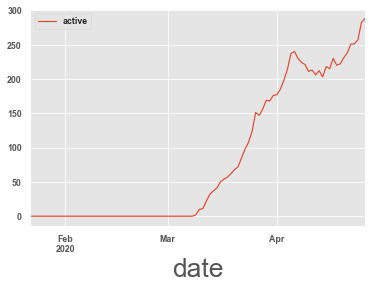

In [363]:
plt.figure(figsize=(20,12))

df_active[df_active['country']=='Albania'][['active']].plot();

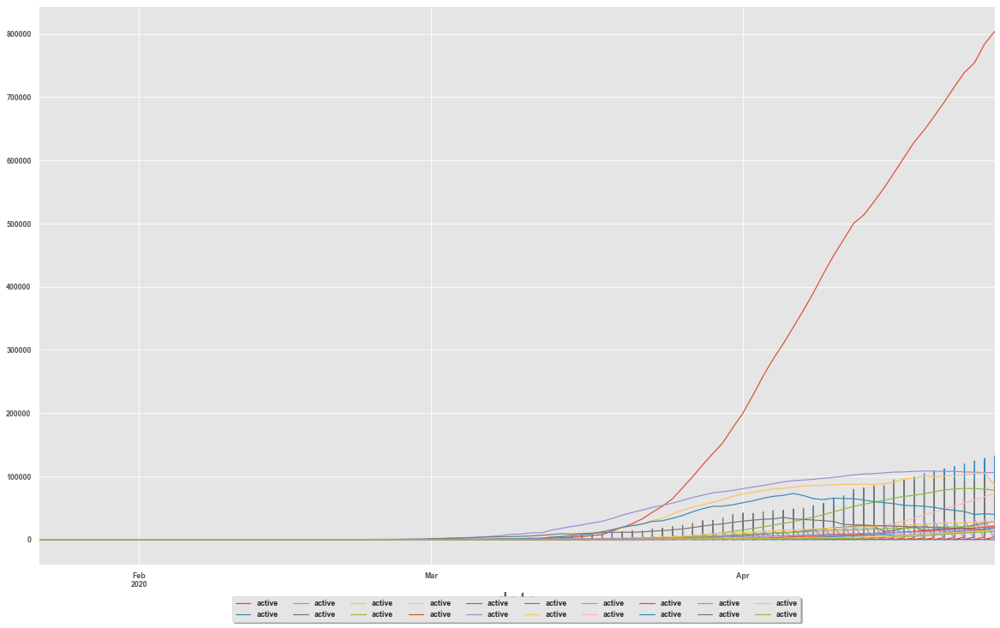

In [364]:
plt.figure(figsize=(20,12))

for c in top_actives_list:
    df_active[df_active['country']==c]['active'].plot();

plt.legend(loc='upper center', bbox_to_anchor=(0.5, -0.05), fancybox=True, shadow=True, ncol=10)
plt.show()

In [365]:
# prepare timeseries data
df_us = df_us.drop(columns=['country'])

# sort date
df_us = df_us.sort_values(['date'])

df_us

,date,confirmed,deaths,recovered,active
225,2020-01-22,1,0,0,1
487,2020-01-23,1,0,0,1
749,2020-01-24,2,0,0,2
1011,2020-01-25,2,0,0,2
1273,2020-01-26,5,0,0,5
1535,2020-01-27,5,0,0,5
1797,2020-01-28,5,0,0,5
2059,2020-01-29,5,0,0,5
2321,2020-01-30,5,0,0,5
2583,2020-01-31,7,0,0,7


In [366]:
len(df_us)

96

In [367]:
# set date column as index
df_us = df_us.set_index('date')
df_us

,confirmed,deaths,recovered,active
date,,,,
2020-01-22,1,0,0,1
2020-01-23,1,0,0,1
2020-01-24,2,0,0,2
2020-01-25,2,0,0,2
2020-01-26,5,0,0,5
2020-01-27,5,0,0,5
2020-01-28,5,0,0,5
2020-01-29,5,0,0,5
2020-01-30,5,0,0,5


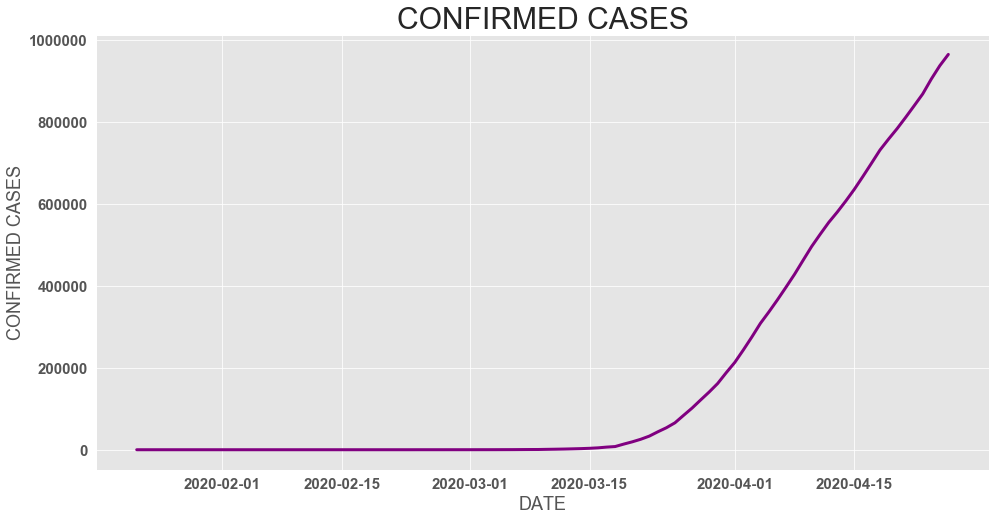

In [368]:
# visualize the confirmed cases
plt.figure(figsize=(16,8))
plt.xticks(fontsize = 15)
plt.yticks(fontsize = 15)
plt.title('CONFIRMED CASES', fontsize=30)
plt.plot(df_us['confirmed'], lw=3, color = 'purple')
plt.xlabel('DATE', fontsize=18)
plt.ylabel('CONFIRMED CASES', fontsize=18)
plt.show()

In [369]:
# Create a new dataframe with only the confirmed column
data = df_us.filter(['confirmed'])

# Convert the dataframe to a numpy array
dataset = data.values

# Get the number of rows to train the model on
training_data_len = int(np.ceil( len(dataset) * .8 ))

training_data_len

77

In [370]:
# view dataset
dataset

array([[     1],
       [     1],
       [     2],
       [     2],
       [     5],
       [     5],
       [     5],
       [     5],
       [     5],
       [     7],
       [     8],
       [     8],
       [    11],
       [    11],
       [    11],
       [    11],
       [    11],
       [    11],
       [    11],
       [    11],
       [    12],
       [    12],
       [    13],
       [    13],
       [    13],
       [    13],
       [    13],
       [    13],
       [    13],
       [    13],
       [    15],
       [    15],
       [    15],
       [    51],
       [    51],
       [    57],
       [    58],
       [    60],
       [    68],
       [    74],
       [    98],
       [   118],
       [   149],
       [   217],
       [   262],
       [   402],
       [   518],
       [   583],
       [   959],
       [  1281],
       [  1663],
       [  2179],
       [  2727],
       [  3499],
       [  4632],
       [  6421],
       [  7783],
       [ 13747],
       [ 19273

In [371]:
# Scale the data
from sklearn.preprocessing import MinMaxScaler

scaler = MinMaxScaler(feature_range=(0,1))
scaled_data = scaler.fit_transform(dataset)

scaled_data

array([[0.00000000e+00],
       [0.00000000e+00],
       [1.03542821e-06],
       [1.03542821e-06],
       [4.14171285e-06],
       [4.14171285e-06],
       [4.14171285e-06],
       [4.14171285e-06],
       [4.14171285e-06],
       [6.21256927e-06],
       [7.24799748e-06],
       [7.24799748e-06],
       [1.03542821e-05],
       [1.03542821e-05],
       [1.03542821e-05],
       [1.03542821e-05],
       [1.03542821e-05],
       [1.03542821e-05],
       [1.03542821e-05],
       [1.03542821e-05],
       [1.13897103e-05],
       [1.13897103e-05],
       [1.24251385e-05],
       [1.24251385e-05],
       [1.24251385e-05],
       [1.24251385e-05],
       [1.24251385e-05],
       [1.24251385e-05],
       [1.24251385e-05],
       [1.24251385e-05],
       [1.44959950e-05],
       [1.44959950e-05],
       [1.44959950e-05],
       [5.17714106e-05],
       [5.17714106e-05],
       [5.79839799e-05],
       [5.90194081e-05],
       [6.10902645e-05],
       [6.93736902e-05],
       [7.55862595e-05],


In [372]:
# Create the training data set
# Create the scaled training data set
train_data = scaled_data[0:int(training_data_len), :]

# Split the data into x_train and y_train data sets
x_train = []
y_train = []



In [373]:
range(60, len(train_data))

range(60, 77)

In [374]:
chunk_size=7
for i in range(chunk_size, len(train_data)):
    x_train.append(train_data[i-chunk_size:i, 0])
    y_train.append(train_data[i, 0])

In [375]:
print(x_train)
print(y_train)

[array([0.00000000e+00, 0.00000000e+00, 1.03542821e-06, 1.03542821e-06,
       4.14171285e-06, 4.14171285e-06, 4.14171285e-06]), array([0.00000000e+00, 1.03542821e-06, 1.03542821e-06, 4.14171285e-06,
       4.14171285e-06, 4.14171285e-06, 4.14171285e-06]), array([1.03542821e-06, 1.03542821e-06, 4.14171285e-06, 4.14171285e-06,
       4.14171285e-06, 4.14171285e-06, 4.14171285e-06]), array([1.03542821e-06, 4.14171285e-06, 4.14171285e-06, 4.14171285e-06,
       4.14171285e-06, 4.14171285e-06, 6.21256927e-06]), array([4.14171285e-06, 4.14171285e-06, 4.14171285e-06, 4.14171285e-06,
       4.14171285e-06, 6.21256927e-06, 7.24799748e-06]), array([4.14171285e-06, 4.14171285e-06, 4.14171285e-06, 4.14171285e-06,
       6.21256927e-06, 7.24799748e-06, 7.24799748e-06]), array([4.14171285e-06, 4.14171285e-06, 4.14171285e-06, 6.21256927e-06,
       7.24799748e-06, 7.24799748e-06, 1.03542821e-05]), array([4.14171285e-06, 4.14171285e-06, 6.21256927e-06, 7.24799748e-06,
       7.24799748e-06, 1.0354282

In [376]:
# Convert the x_train and y_train to numpy arrays 
x_train, y_train = np.array(x_train), np.array(y_train)

In [377]:
# Reshape the data
x_train = np.reshape(x_train, (x_train.shape[0], x_train.shape[1], 1))
x_train.shape

(70, 7, 1)

In [378]:
import os
import sys
stderr = sys.stderr
sys.stderr = open(os.devnull, 'w')
import keras
sys.stderr = stderr
from keras.models import Sequential
from keras.layers import Dense, LSTM

# Build the LSTM model
model = Sequential()
model.add(LSTM(50, return_sequences=True, input_shape= (x_train.shape[1], 1)))
model.add(LSTM(50, return_sequences= False))
model.add(Dense(25))
model.add(Dense(1))

In [379]:
# Compile the model
model.compile(optimizer='adam', loss='mean_squared_error')

In [380]:
# Train the model
model.fit(x_train, y_train, batch_size=1, epochs=30)

Epoch 1/30
70/70 [==============================] - 1s 14ms/step - loss: 0.0052
Epoch 2/30
70/70 [==============================] - 0s 4ms/step - loss: 6.4806e-04
Epoch 3/30
70/70 [==============================] - 0s 4ms/step - loss: 7.4429e-04
Epoch 4/30
70/70 [==============================] - 0s 4ms/step - loss: 5.2839e-04
Epoch 5/30
70/70 [==============================] - 0s 4ms/step - loss: 7.8236e-04
Epoch 6/30
70/70 [==============================] - 0s 4ms/step - loss: 5.5971e-04
Epoch 7/30
70/70 [==============================] - 0s 4ms/step - loss: 2.9649e-04
Epoch 8/30
70/70 [==============================] - 0s 4ms/step - loss: 3.7132e-04
Epoch 9/30
70/70 [==============================] - 0s 4ms/step - loss: 5.4108e-04
Epoch 10/30
70/70 [==============================] - 0s 4ms/step - loss: 2.0106e-04
Epoch 11/30
70/70 [==============================] - 0s 4ms/step - loss: 2.6981e-04
Epoch 12/30
70/70 [==============================] - 0s 4ms/step - loss: 6.6694e-04
Epoc

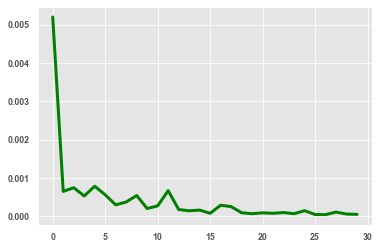

In [381]:
# examine the loss function v.s. epoch
loss_per_epoch = model.history.history['loss']
plt.plot(range(len(loss_per_epoch)),loss_per_epoch, lw=3, color = 'green');

In [382]:
min(loss_per_epoch)

4.172980149148893e-05

In [383]:
# Create the testing data set (use the last chunk size in train data to predict the 1 data in test data)
test_data = scaled_data[training_data_len - chunk_size:, :]

# Create the data sets x_test and y_test
x_test = []
y_test = dataset[training_data_len:, :]
for i in range(chunk_size, len(test_data)):
    x_test.append(test_data[i-chunk_size:i, 0])

In [384]:
# Convert the data to a numpy array
x_test = np.array(x_test)

In [385]:
# Reshape the data
x_test = np.reshape(x_test, (x_test.shape[0], x_test.shape[1], 1 ))

In [386]:
# Get the models predict values 
predictions = model.predict(x_test)
predictions = scaler.inverse_transform(predictions)

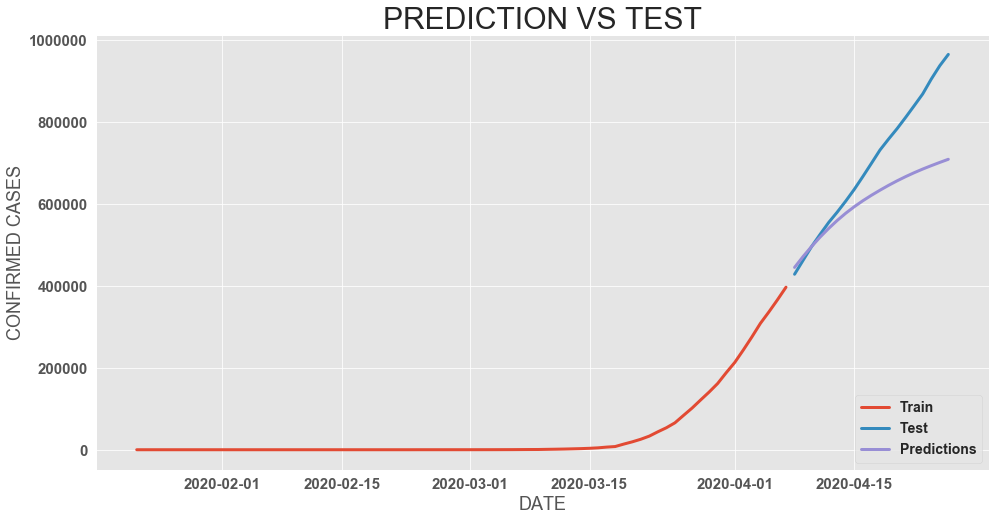

In [387]:
# Plot the data
train = data[:training_data_len]
test = data[training_data_len:]
test['predictions'] = predictions

# Visualize the data
plt.figure(figsize=(16,8))
plt.xticks(fontsize = 15)
plt.yticks(fontsize = 15)
plt.title('PREDICTION VS TEST', fontsize=30)
plt.xlabel('DATE', fontsize=18)
plt.ylabel('CONFIRMED CASES', fontsize=18)
plt.plot(train['confirmed'], lw=3)
# plt.plot(data['confirmed'], lw=9, color='tab:blue', solid_capstyle='projecting')
plt.plot(test[['confirmed', 'predictions']], lw=3)
plt.legend(['Train', 'Test', 'Predictions'], loc='lower right', fontsize=14)
plt.show()

In [388]:
# show the table of prediction v.s. test
test

,confirmed,predictions
date,,
2020-04-08,428654,445344.68750
2020-04-09,462780,471935.53125
2020-04-10,496535,496676.90625
2020-04-11,526396,519688.31250
2020-04-12,555313,540759.75000
2020-04-13,580619,560258.00000
2020-04-14,607670,577915.62500
2020-04-15,636350,593845.81250
2020-04-16,667592,608331.31250


### Changes in United States Data following the new CDC guidelines on "Case" and "Death" definition

#### Following new CDC guidelines: "As of April 14, 2020, CDC case counts and death counts include both confirmed and probable cases and deaths. This change was made to reflect an interim COVID-19 position statement issued by the Council for State and Territorial Epidemiologists on April 5, 2020. The position statement included a case definition and made COVID-19 a nationally notifiable disease.

# PREDICT INTO THE FUTURE

### TRY TO PREDICT FOR ONE DAY AHEAD BASED ON THE LAST 30 DAYS

In [389]:
# Create the testing data set
predict_data = scaled_data[len(scaled_data) - chunk_size:, :]

# Create the data sets x_test and y_test
x_predict = []
x_predict.append(predict_data[:, 0])
    

In [390]:
# Convert the data to a numpy array
x_predict = np.array(x_predict)

In [391]:
# Reshape the data
x_predict = np.reshape(x_predict, (x_predict.shape[0], x_predict.shape[1], 1 ))

In [392]:
# Get the models predict values 
future_predictions = model.predict(x_predict)

future_predictions

array([[0.7422363]], dtype=float32)

In [393]:
# inverse value
future_predictions = scaler.inverse_transform(future_predictions)

In [394]:
print(future_predictions)

[[716840.94]]


### NOW, TRY TO PREDICT FOR THE NEXT 2 DAYS

In [395]:
future_days = 2

new_predictions = []

for i in range(future_days):
    # Get the models predicted price values 
    predictions = model.predict(x_predict)

    # take the predicted value only
    current_prediction = predictions[0]
    print(current_prediction)
    
    # store prediction
    new_predictions.append(current_prediction) 
    
    # update batch to now include prediction and drop first value
    x_predict = np.append(x_predict[:,1:,:],[[current_prediction]], axis=1)
    

[0.7422363]
[0.741312]


In [396]:
# inverse values
new_predictions = scaler.inverse_transform(new_predictions)
new_predictions

array([[716840.95840883],
       [715948.29466248]])

In [397]:
# last date in dataset
data.index[-1]

Timestamp('2020-04-26 00:00:00')

In [398]:
# build future dates of next 7 days
future_dates = pd.date_range(data.index[-1], periods=3, freq='D')
future_dates = future_dates[1:]
future_dates

DatetimeIndex(['2020-04-27', '2020-04-28'], dtype='datetime64[ns]', freq='D')

In [399]:
# reshape new prediction to get values only
new_predictions = np.reshape(new_predictions, new_predictions.shape[0])

In [400]:
# build dataframe of future predicted data
future_df = pd.DataFrame({'date': future_dates, 'future predictions': new_predictions})

In [401]:
# set date as index
future_df = future_df.set_index(['date'])
future_df

,future predictions
date,
2020-04-27,716840.958409
2020-04-28,715948.294662


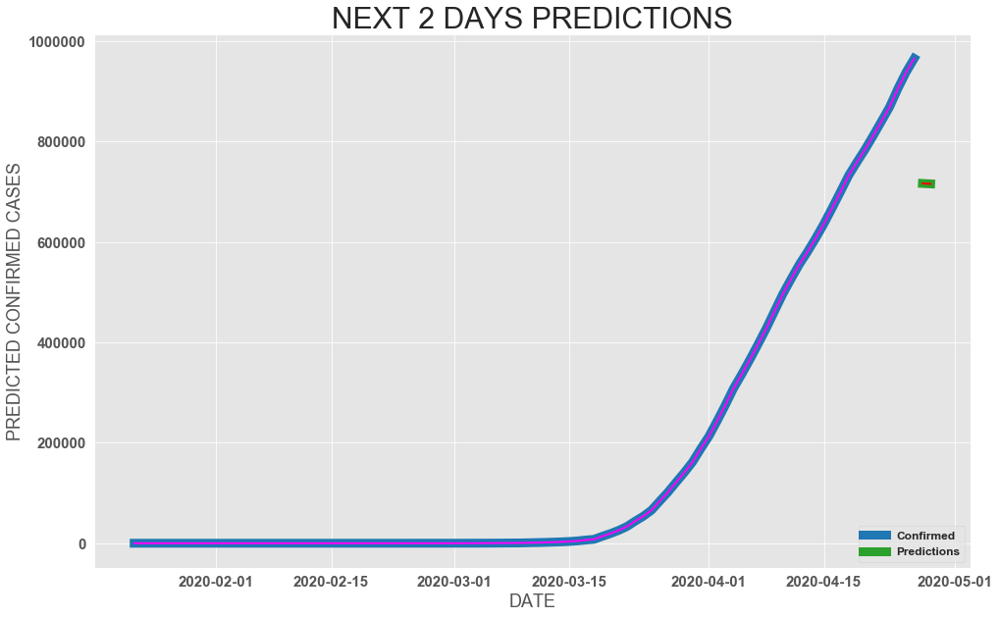

In [402]:
# Visualize the data
plt.figure(figsize=(16,10))
plt.xticks(fontsize = 15)
plt.yticks(fontsize = 15)
plt.title('NEXT 2 DAYS PREDICTIONS', fontsize=30)
plt.xlabel('DATE', fontsize=18)
plt.ylabel('PREDICTED CONFIRMED CASES', fontsize=18)

plt.plot(data['confirmed'], lw=9, color='tab:blue', solid_capstyle='projecting')
plt.plot(future_df['future predictions'], lw=9, color='tab:green', solid_capstyle='projecting')
plt.plot(data['confirmed'], lw=2, color= 'magenta')
plt.plot(future_df['future predictions'], lw=2, color='red')

plt.legend(['Confirmed','Predictions'], loc='lower right', fontsize=12)
plt.show()


<p><img src="./covid_economy.png" alt="Project Image Record" width="600px"></p>

There is a fact that we are in pandemic time due to coronavirus, a lot of people are in pain and in loss. The covid_19 spread has left businesses around the world counting costs. Disease, Poverty, Death and Destruction and Chaos and darkness time for all groups in society. And ofcourse, coronavirus has a significant impact on economy as well. There has been a big shifts in stock markets, where shares in companies are bought and sold, can affect many investments in pensions or individual savings accounts (ISAs).
The FTSE, Dow Jones Industrial Average and the Nikkei have all seen huge falls since the outbreak began on 31 December.
https://www.bbc.com/news/business-51706225
The Dow and the FTSE recently saw their biggest one day declines since 1987.

<p><img src="./stockmarket.png" alt="Project Image Record" width="600px"></p>

#### From 24 to 28 February, stock markets worldwide reported their largest one-week declines since the 2008 financial crisis, thus entering a correction. Global markets into early March became extremely volatile, with large swings occurring in global markets. On 9 March, most global markets reported severe contractions, mainly in response to the 2019–20 coronavirus pandemic and an oil price war between Russia and the OPEC countries led by Saudi Arabia. This became colloquially known as Black Monday. At the time was the worst drop since the Great Recession in 2008.

<p><img src="./FTSE100.png" alt="Project Image Record" width="600px"></p>

####  The Stay home for 15 days campain (became 45 days instead of 15 days): The United States,  the number of people filing for unemployment hit a record high, signalling an end to a decade of expansion for one of the world's largest economies.

<p><img src="./USjobless.png" alt="Project Image Record" width="600px"></p>

### Consumers stockpiling food
Supermarkets and online delivery services have reported a huge growth in demand as customers stockpile goods such as toilet paper, rice and orange juice as the pandemic escalates.

<p><img src="./Orangejuice.png" alt="Project Image Record" width="600px"></p>

### How the coronavirus is rattling the markets and what investors can do to navigate it, where might investors find opportunity?

### Technology: Brian Colello -Director of Technology Equity Research at Morningstar

There are several technology stocks where the damage from the coronavirus outbreak might be limited. A few tech stocks would stand to benefit from more people working remotely. Some of these stocks are undervalued today; some aren’t. Zoom (ZOOM) is countercyclical to coronavirus and has done quite well during the sell-off; it’s probably our best example of a stock that actually benefits from the virus but is expensive. Slack (WORK) benefits from a remote worker theme as well and could theoretically benefit from a prolonged virus outbreak, ect. We will work on projecting some technology company stock price to find opportunity in investment.



In [403]:
# plt.figure(figsize=(20,12))

# for c in country:
#      df_active[df_active['country']==c][['active']].plot(label=c)

# plt.legend(loc='upper center', bbox_to_anchor=(0.5, -0.05), fancybox=True, shadow=True, ncol=10)
# plt.show()

In [404]:
#  plt.figure(figsize=(20,12))

#  for c in country:
#      df_active[df_active['country']==c]['active'].plot(label=c)

#  plt.legend(loc='upper center', bbox_to_anchor=(0.5, -0.05), fancybox=True, shadow=True, ncol=10)
#  plt.show()

In [405]:
# rcParams['figure.figsize'] = 12,5

# for country in top_actives[0:10]:
#     results = seasonal_decompose(df1.loc[df1['country'] == country].active, model='add')
#     fig = results.plot();
#     fig.text(0.5, 1, f'COUNTRY: {country}')